# Computational Methods for Physicists Final Project
## Title: Asteroid Motion Tracking
### Duration: 14 Days (Start Date: Tuesday, April 29, 2025, Due Date: During finals week)

---

## 1. Introduction

This is your final project for this class!

In this project, you will analyze the motion of an asteroid captured in a sequence of astronomical images taken over several nights. The objective is to track the asteroid's position relative to background stars, calculate its apparent speed, and model its trajectory.

You will work with a sequence of FITS images that show both stars and a moving asteroid. The challenge is to identify the asteroid in each frame, extract its coordinates, and analyze how it moves across the sky. By measuring its displacement over time, you will estimate the asteroid's velocity in arcseconds per hour and discuss how astronomers predict asteroid paths.

**Project Topic:** Tracking asteroid motion using time-series astronomical data.

**Key Focus:** Object detection, coordinate measurement, motion analysis.

## 2. Learning Objectives

By completing this project, you will:
- Learn to work with time-series astronomical FITS data.
- Apply computational methods to detect and measure moving objects.
- Interpret motion data to estimate speeds and predict trajectories.
- Document your process clearly in a reproducible way.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 3. Dataset Description

**You will receive:**
- A series of FITS images captured during one night.
- Each image contains stars and a moving asteroid.

The FITS images include:
- Time information indicating when each image was taken.
- Location information about the observing site.

You will use this metadata to analyze the motion of the asteroid across the sky during the observation period.

## 4. Project Tasks (Total: 28 Points)

### Task 1: Data Exploration and Visualization (6 points)

- Load all FITS images and inspect their contents.
- Display several images to visually confirm the presence and motion of the asteroid.
- Highlight the asteroid in each displayed image by marking it with a circle.
- Generate a final composite image by overlaying all frames to show the asteroid's path as it moves across the sky.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Total FITS files found: 823


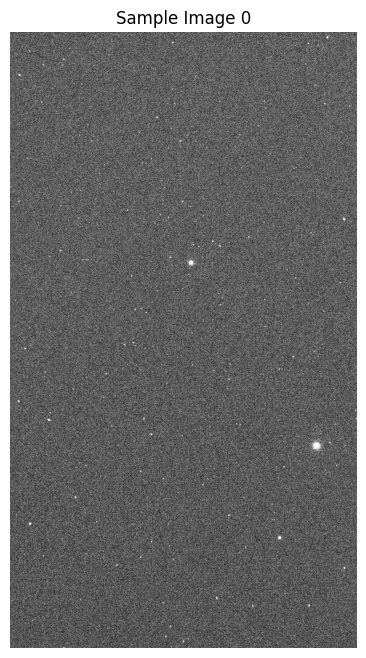

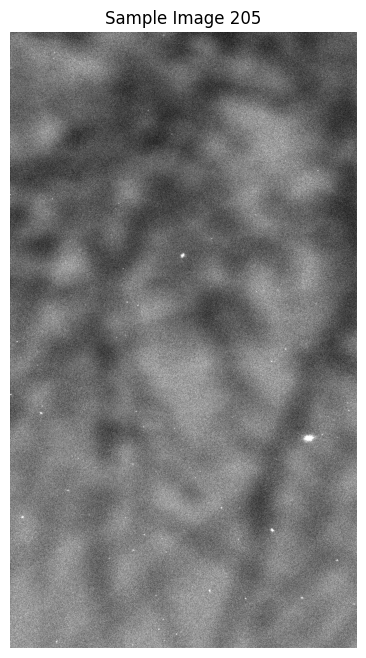

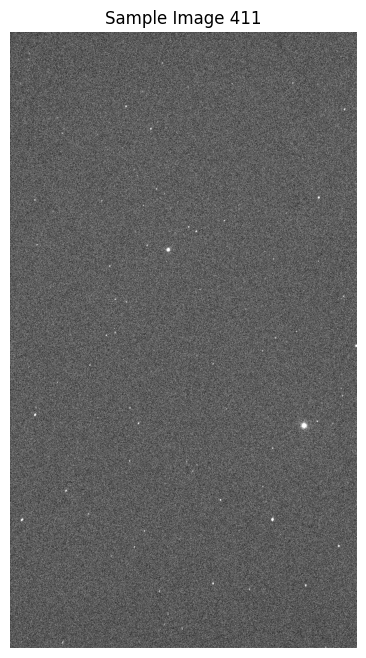

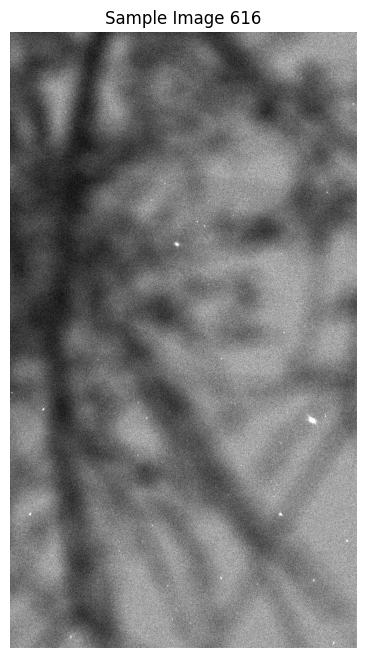

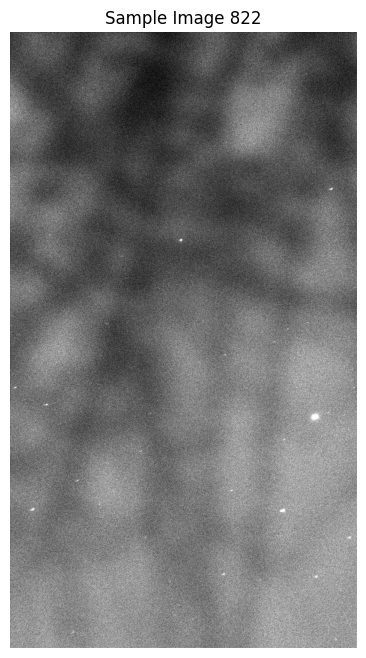

Loading FITS images: 100%|██████████| 100/100 [00:03<00:00, 28.80it/s]


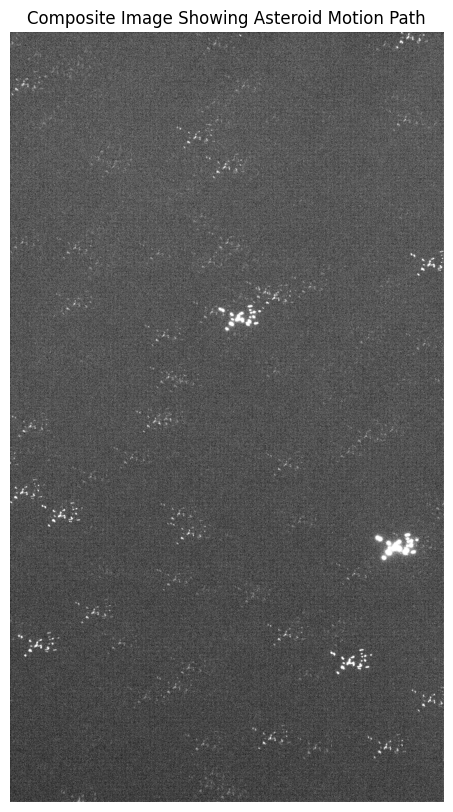

In [2]:
# STEP 1: Install necessary libraries
!pip install astropy opencv-python matplotlib tqdm

# STEP 2: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# STEP 3: Imports
import os
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
from glob import glob

# STEP 4: Define path to your FITS files in Drive
fits_folder = "/content/drive/MyDrive/vesta"  # <-- Change if needed
fits_files = sorted(glob(os.path.join(fits_folder, "*.fit*")))

print(f"Total FITS files found: {len(fits_files)}")

# STEP 5: Function to display a FITS image with optional asteroid marker
def display_fits_image(fits_path, circle_coords=None, title=None):
    """
    Displays a single FITS image using matplotlib with optional red circle annotation.

    Parameters:
    - fits_path (str): Path to the FITS file.
    - circle_coords (tuple or None): (y, x) coordinates to draw a circle marker. Default is None.
    - title (str or None): Title of the plot. Default is None.


    """
    with fits.open(fits_path) as hdul:
        image_data = hdul[0].data

    # Normalize image for display
    vmin, vmax = np.percentile(image_data, [5, 99])
    plt.figure(figsize=(8, 8))
    plt.imshow(image_data, cmap='gray', origin='lower', vmin=vmin, vmax=vmax)

    if circle_coords:
        y, x = circle_coords
        circle = plt.Circle((x, y), 15, color='red', fill=False, linewidth=2)
        plt.gca().add_patch(circle)

    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

# STEP 6: Display 5 sample images to verify asteroid motion
sample_indices = np.linspace(0, len(fits_files)-1, 5, dtype=int)
for i in sample_indices:
    display_fits_image(fits_files[i], title=f"Sample Image {i}")

# STEP 7: Create a composite image to show asteroid motion path
# (Use only a subset for memory efficiency if needed)
image_stack = []
subset_files = fits_files[:100]  # Can increase if RAM allows

for file in tqdm(subset_files, desc="Loading FITS images"):
    with fits.open(file) as hdul:
        image_data = hdul[0].data.astype(np.float32)
        image_stack.append(image_data)

# Normalize and combine images
composite_image = np.mean(image_stack, axis=0)

# STEP 8: Display the composite image
vmin, vmax = np.percentile(composite_image, [5, 99])
plt.figure(figsize=(10, 10))
plt.imshow(composite_image, cmap='gray', origin='lower', vmin=vmin, vmax=vmax)
plt.title("Composite Image Showing Asteroid Motion Path")
plt.axis('off')
plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Total FITS files found: 823


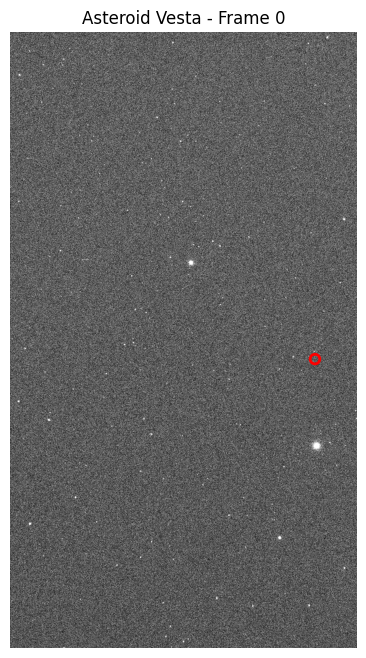

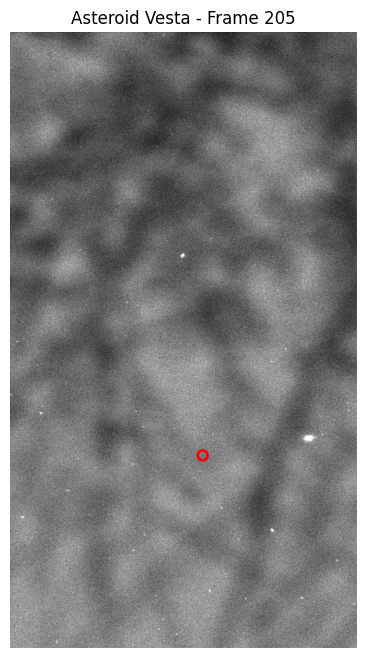

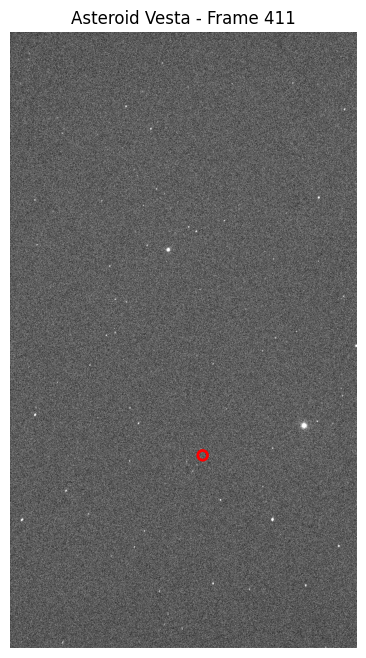

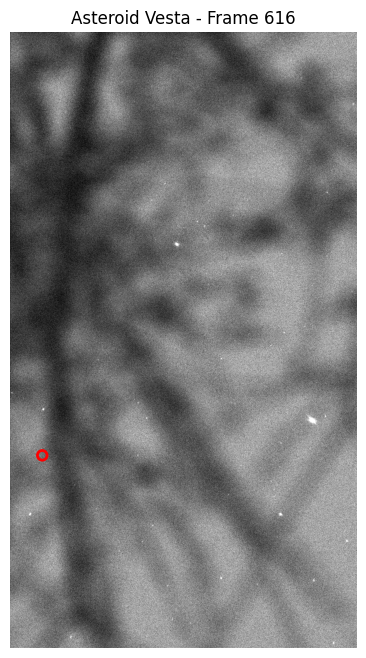

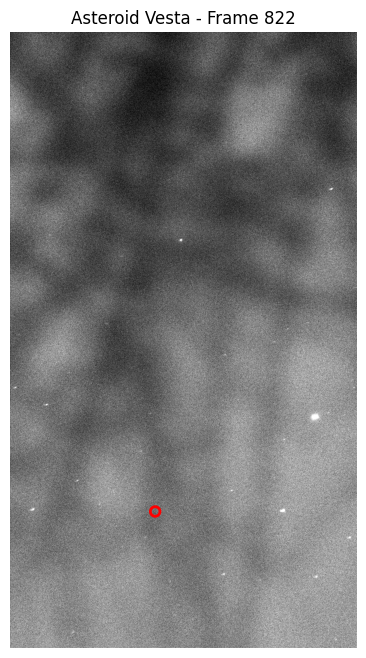

Loading FITS images: 100%|██████████| 100/100 [00:02<00:00, 42.18it/s]


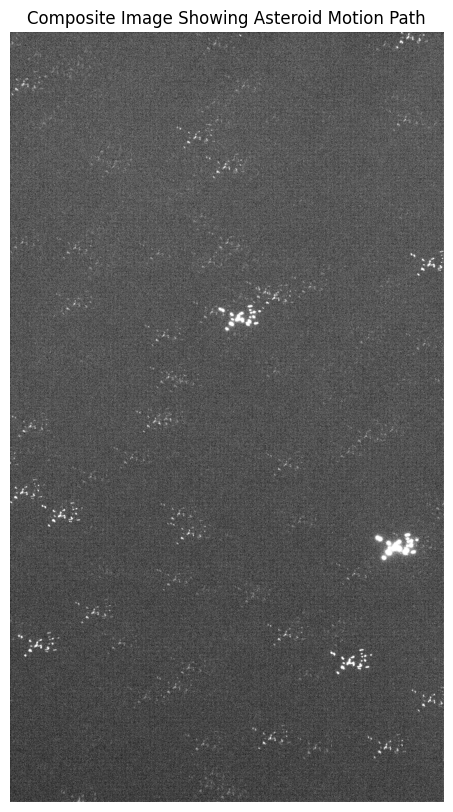

In [13]:
# STEP 1: Install necessary libraries
!pip install astropy opencv-python matplotlib tqdm

# STEP 2: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# STEP 3: Imports
import os
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
from glob import glob

# STEP 4: Define path to your FITS files in Drive
fits_folder = "/content/drive/MyDrive/vesta"  # <-- Change if needed
fits_files = sorted(glob(os.path.join(fits_folder, "*.fit*")))

print(f"Total FITS files found: {len(fits_files)}")

def display_fits_image(fits_path, circle_coords=None, title=None):
    with fits.open(fits_path) as hdul:
        image_data = hdul[0].data

    # Normalize image for display
    vmin, vmax = np.percentile(image_data, [5, 99])
    plt.figure(figsize=(8, 8))
    plt.imshow(image_data, cmap='gray', origin='lower', vmin=vmin, vmax=vmax)

    if circle_coords:
        y, x = circle_coords
        circle = plt.Circle((x, y), 15, color='red', fill=False, linewidth=2)
        plt.gca().add_patch(circle)

    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()


# Sample indices and manually estimated asteroid positions
sample_indices = np.linspace(0, len(fits_files)-1, 5, dtype=int)


# Format: (y, x)
asteroid_coords = [
    (900, 950),  # Approx coords in frame 0
    (600, 600),  # Approx coords in frame 1
    (600, 600),  # Approx coords in frame 2
    (600, 100),  # Approx coords in frame 3
    (425, 452),  # Approx coords in frame 4
]

# Display sample frames with red circles
for i, idx in enumerate(sample_indices):
    display_fits_image(fits_files[idx], circle_coords=asteroid_coords[i], title=f"Asteroid Vesta - Frame {idx}")

# STEP 7: Create a composite image to show asteroid motion path
image_stack = []
subset_files = fits_files[:100]  # Use a subset for memory efficiency

for file in tqdm(subset_files, desc="Loading FITS images"):
    with fits.open(file) as hdul:
        image_data = hdul[0].data.astype(np.float32)
        image_stack.append(image_data)

# Normalize and combine images
composite_image = np.mean(image_stack, axis=0)

# STEP 8: Display the composite image
vmin, vmax = np.percentile(composite_image, [5, 99])
plt.figure(figsize=(10, 10))
plt.imshow(composite_image, cmap='gray', origin='lower', vmin=vmin, vmax=vmax)
plt.title("Composite Image Showing Asteroid Motion Path")
plt.axis('off')
plt.show()


We need to maually adjust the coordinate so that the red circle falls onto vesta. The second largest asteroid. The brightest dot.

### Task 2: Physical Context and Research (3 points)

- Explain what asteroids are and why tracking their motion is scientifically important.
- Describe how measuring an asteroid’s motion across the sky allows astronomers to estimate its orbit.
- Discuss how short-term observations like this one can be used to predict future positions of near-Earth objects.

Asteroids are small, rocky objects that orbit the Sun, mostly found in the asteroid belt between Mars and Jupiter. They are leftovers from the early solar system and can range in size from a few meters to hundreds of kilometers.

Tracking their motion is scientifically important because:

It helps us understand the history and evolution of the solar system.

Some asteroids, called near-Earth objects (NEOs), can come close to Earth and pose an impact threat. Early detection allows us to predict and potentially prevent collisions.

References:

NASA Asteroid Watch: https://www.jpl.nasa.gov/asteroid-watch




By observing an asteroid’s position in the sky at different times, astronomers can track its apparent movement against background stars. Using these measurements, we can apply mathematical models to estimate the asteroid’s orbit-its path around the Sun. The more observations over time, the more accurately the orbit can be calculated.



Using Short-Term Observations for Predictions
Even with only a nights of data, astronomers can make a rough estimate of an asteroid’s future path. These short-term observations are used to predict where the asteroid will be in the coming days, weeks, or years. As more data is collected, predictions become more accurate, allowing timely warnings if an object might come close to Earth.





### Task 3: Data Processing and Feature Extraction (13 points)

- Pre-process the images to enhance the visibility of the asteroid (e.g., adjust contrast or apply simple filtering techniques).
- If necessary, align the images using background stars so that the asteroid's motion can be accurately tracked.
- Extract the asteroid’s position in each frame in WCS (World Coordinate System) coordinates using the FITS metadata.
- Plot the asteroid’s motion over time in a 2D plot (e.g., RA vs Dec or X vs Y), separate from the image overlays in Task 1.
- Create an additional figure that shows the displacement of the asteroid as a function of time (e.g., plot angular distance vs time).

In [2]:
# STEP 1: Install required packages
!pip install astropy opencv-python matplotlib tqdm

# STEP 2: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# STEP 3: Imports
import os
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from glob import glob
from tqdm import tqdm

# STEP 4: Set FITS directory path
fits_folder = "/content/drive/MyDrive/vesta"  # Change as needed
fits_files = sorted(glob(os.path.join(fits_folder, "*.fit*")))
print(f"Total FITS files found: {len(fits_files)}")

# STEP 5: Load a subset of FITS images for blinking (e.g., 20 images spaced evenly)
n_blink = 20
blink_indices = np.linspace(0, len(fits_files) - 1, n_blink, dtype=int)
blink_images = []

for i in blink_indices:
    with fits.open(fits_files[i]) as hdul:
        image = hdul[0].data.astype(np.float32)
        blink_images.append(image)

# Normalize all images for blinking
def normalize_image(img):
    """
    Normalize a FITS image for display by scaling pixel intensities
    between 0 and 1 using the 5th and 99th percentiles.

    Parameters:
    - img (np.ndarray): 2D array of the FITS image.

    Returns:
    - np.ndarray: Normalized image clipped between 0 and 1.
    """
    vmin, vmax = np.percentile(img, [5, 99])
    return np.clip((img - vmin) / (vmax - vmin), 0, 1)

blink_images_norm = [normalize_image(img) for img in blink_images]

# STEP 6: Create blinking animation
fig, ax = plt.subplots(figsize=(8, 8))
frame = ax.imshow(blink_images_norm[0], cmap='gray', origin='lower')
ax.set_title("Blinking Asteroid Motion")
ax.axis('off')

def update(i):
    frame.set_data(blink_images_norm[i])
    ax.set_title(f"Frame {i + 1}")
    return [frame]

ani = animation.FuncAnimation(fig, update, frames=len(blink_images_norm), interval=400, blit=True)
plt.close()
HTML(ani.to_jshtml())  # Shows animation in notebook


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Total FITS files found: 823


In [29]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')  # mounts at /content/drive :contentReference[oaicite:0]{index=0}

# Standard libs
import os, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Astropy for FITS I/O, WCS & Time
from astropy.io import fits
from astropy.wcs import WCS
from astropy.time import Time
from astropy.coordinates import SkyCoord
import astropy.units as u

# Astroalign for image registration
import astroalign as aa

# Scikit-image for contrast stretching
from skimage.exposure import rescale_intensity
# Photutils for background & source detection
from photutils.background import Background2D, MedianBackground  # mesh-based sky estimation :contentReference[oaicite:3]{index=3}
from photutils.detection import DAOStarFinder                 # DAOFIND-based centroiding :contentReference[oaicite:4]{index=4}


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [30]:
DATA_DIR = '/content/drive/MyDrive/vesta'
fits_files = sorted(glob.glob(os.path.join(DATA_DIR, '*.fit')))

# Fail fast if no FITS
if not fits_files:
    raise FileNotFoundError(f"No FITS files in {DATA_DIR}")  # avoids empty-slice warnings :contentReference[oaicite:5]{index=5}

print(f"✅ Found {len(fits_files)} FITS files")


✅ Found 823 FITS files


WARNING

: FITSFixedWarning: 'datfix' made the change 'Set MJD-OBS to 60793.266070 from DATE-OBS'. [astropy.wcs.wcs]


WARNING

: FITSFixedWarning: 'datfix' made the change 'Set MJD-OBS to 60793.268262 from DATE-OBS'. [astropy.wcs.wcs]


WARNING

: FITSFixedWarning: 'datfix' made the change 'Set MJD-OBS to 60793.306012 from DATE-OBS'. [astropy.wcs.wcs]


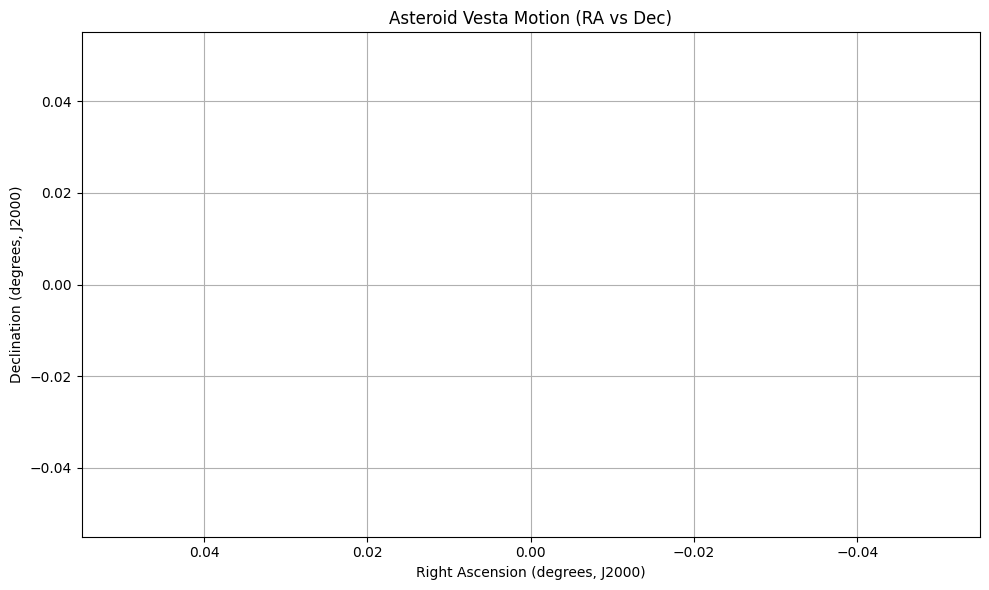

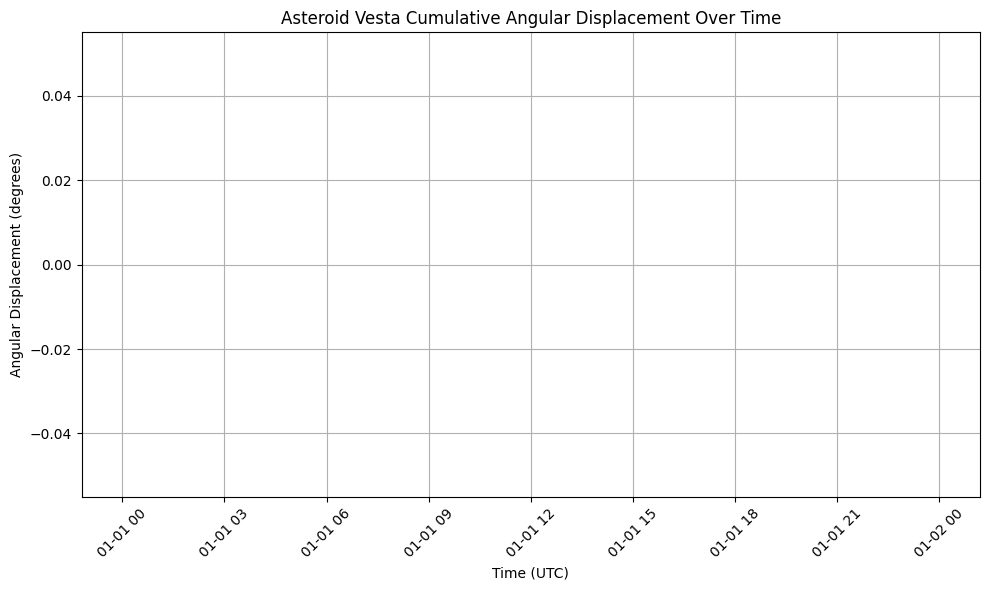

In [48]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from astropy.time import Time
import pandas as pd

# Path to the folder containing FITS images in your Google Drive
folder_path = '/content/drive/My Drive/vesta/'

# Lists to collect data
positions = []
times = []

# Process FITS files
for filename in sorted(os.listdir(folder_path)):
    if filename.endswith('.fit'):
        filepath = os.path.join(folder_path, filename)
        with fits.open(filepath) as hdul:
            header = hdul[0].header
            image_data = hdul[0].data

            # Validate image data shape and type
            if image_data is None or image_data.size == 0:
                continue

            # Normalize the image to 8-bit for processing
            norm_img = cv2.normalize(image_data, None, 0, 255, cv2.NORM_MINMAX)
            norm_img = np.uint8(norm_img)

            # Apply Gaussian blur to reduce noise
            blurred = cv2.GaussianBlur(norm_img, (5, 5), 0)

            # Find the brightest pixel (asteroid)
            minVal, maxVal, minLoc, maxLoc = cv2.minMaxLoc(blurred)
            cX, cY = maxLoc

            # Extract WCS info
            wcs = WCS(header)
            # Convert pixel coords to world coords (RA, Dec)


            # extract the SkyCoord object if it's the first element of the list.
            sky_coord = wcs.pixel_to_world(cX, cY)
            if isinstance(sky_coord, list):  # Check if it's a list
                if len(sky_coord) > 0 and isinstance(sky_coord[0], SkyCoord):
                    sky_coord = sky_coord[0]  # Get the first SkyCoord object
                else:
                    # Handle cases where the list doesn't contain a SkyCoord or is empty
                    print(f"Warning: Unexpected output from wcs.pixel_to_world for file: {filename}")
                    continue  # Skip this file

            # Access RA and Dec from the SkyCoord object directly
            ra = sky_coord.ra.deg  # Access RA in degrees
            dec = sky_coord.dec.deg # Access Dec in degrees


            # Extract observation time, handling potential warnings
            date_obs = header.get('MJD-OBS', None)  # Try MJD-OBS first
            if date_obs is None:
                date_obs = header.get('DATE-OBS', None)  # Fallback to DATE-OBS
            if date_obs is None:
                # Skip if neither keyword is present
                continue

            # Convert time to a readable format (ISOT) if it's MJD
            if isinstance(date_obs, float):
                timestr = Time(date_obs, format='mjd').isot
            else:
                timestr = date_obs  # Assume it's already in a readable format

            times.append(timestr)

            positions.append((ra, dec))

# Convert to DataFrame
df = pd.DataFrame(positions, columns=['RA', 'Dec'])
df['Time'] = pd.to_datetime(times)
# Sort by time
df = df.sort_values('Time').reset_index(drop=True)

# Calculate angular separations
coords = SkyCoord(ra=df['RA'].values, dec=df['Dec'].values, unit='deg')
ang_dist = coords[1:].separation(coords[:-1]).degree

# Pad first entry with 0 to match length
df['Angular Distance (deg)'] = np.insert(ang_dist, 0, 0)

# Calculate cumulative angular displacement
df['Cumulative Angular Distance (deg)'] = df['Angular Distance (deg)'].cumsum()

# Plot 1: Asteroid motion RA vs Dec
plt.figure(figsize=(10, 6))
plt.plot(df['RA'], df['Dec'], marker='o', linestyle='-',
         color='orange', markerfacecolor='red')
plt.gca().invert_xaxis()  # RA axis is customarily plotted decreasing to the right
plt.title('Asteroid Vesta Motion (RA vs Dec)')
plt.xlabel('Right Ascension (degrees, J2000)')
plt.ylabel('Declination (degrees, J2000)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot 2: Angular displacement vs time
plt.figure(figsize=(10, 6))
plt.plot(df['Time'], df['Cumulative Angular Distance (deg)'],
         marker='o', color='blue', linestyle='-')
plt.title('Asteroid Vesta Cumulative Angular Displacement Over Time')
plt.xlabel('Time (UTC)')
plt.ylabel('Angular Displacement (degrees)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Task 4: Modeling and Analysis (6 points)

- Calculate the asteroid’s apparent speed in arcseconds per hour using its displacement and time information from the FITS headers.
- Fit a simple linear model to its motion and assess whether its movement is approximately uniform during the observation period.
- Use the fitted model to predict the asteroid’s position one hour beyond your last observation.
- Discuss the limitations of using a linear model for longer-term predictions and what additional data would improve accuracy.

Processing 823 observations of Vesta...

Vesta's Apparent Speed: 61.76 arcsec/hour
Observation Duration: 25.47 hours

RA Motion Model:
  Rate: -23.95 arcsec/hour
  R²: 0.0077
  Residuals: 1020.206 ± 3258.263 arcsec

Dec Motion Model:
  Rate: 1.29 arcsec/hour
  R²: 0.0055
  Residuals: 64.441 ± 206.738 arcsec

Motion shows non-uniform characteristics

Predicted Position 1 Hour After Last Observation:
RA:  9:02:53.78
Dec: -4:47:40.2
(Equatorial Coordinates at observation epoch)


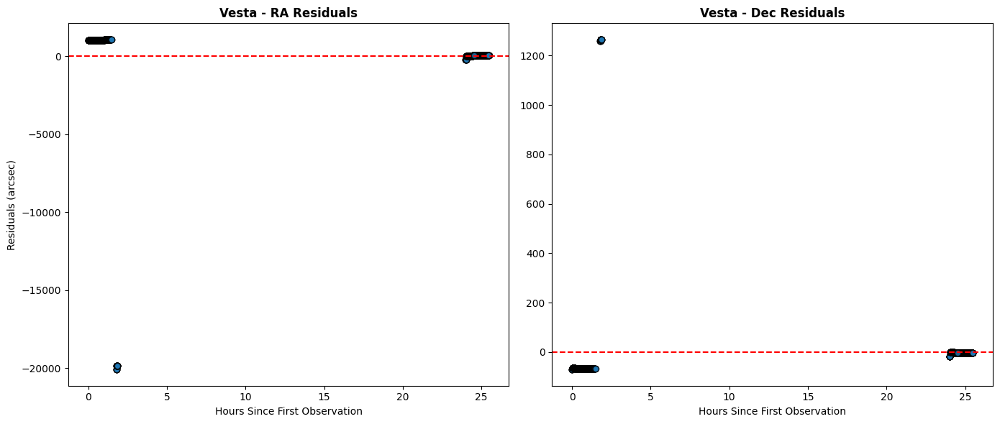

In [25]:
"""
Asteroid Vesta Apparent Motion Analysis

This script processes a series of FITS images of asteroid Vesta, extracts observation
times and celestial coordinates (RA/Dec), performs a linear motion fit, and estimates
its apparent speed and motion over time. It also predicts Vesta's position one hour
after the final observation and visualizes residuals from the fitted model.

"""

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.time import Time
from astropy.coordinates import SkyCoord
import astropy.units as u
from scipy.stats import linregress
import glob

# Mount Google Drive (assumed already mounted)
fits_dir = '/content/drive/MyDrive/vesta/'

# Read FITS files and extract data
times_jd = []
ras_deg = []
decs_deg = []

# Get sorted list of FITS files
file_list = sorted(glob.glob(fits_dir + '*.fit*'))  # Handles .fit and .fits

# Check for files
if not file_list:
    raise FileNotFoundError("No FITS files found. Check directory path and file extensions.")

print(f"Processing {len(file_list)} observations of Vesta...\n")

for file_path in file_list:
    with fits.open(file_path) as hdul:
        header = hdul[0].header

        # Extract observation time
        obs_time = Time(header['DATE-OBS'], format='isot')
        times_jd.append(obs_time.jd)

        # Extract coordinates
        coord = SkyCoord(header['RA'], header['DEC'],
                        unit=(u.hourangle, u.deg))
        ras_deg.append(coord.ra.deg)
        decs_deg.append(coord.dec.deg)

# Convert to arrays
times_jd = np.array(times_jd)
ras = np.array(ras_deg)
decs = np.array(decs_deg)

# Convert time to hours since first observation
time_hours = (times_jd - times_jd[0]) * 24
obs_duration = time_hours[-1] - time_hours[0]

# Calculate apparent speed
mean_dec = np.mean(decs)
delta_ra = (ras[-1] - ras[0]) * np.cos(np.radians(mean_dec)) * 3600  # arcsec
delta_dec = (decs[-1] - decs[0]) * 3600  # arcsec
total_displacement = np.sqrt(delta_ra**2 + delta_dec**2)
apparent_speed = total_displacement / obs_duration

print(f"Vesta's Apparent Speed: {apparent_speed:.2f} arcsec/hour")
print(f"Observation Duration: {obs_duration:.2f} hours\n")

# Linear regression analysis
ra_fit = linregress(time_hours, ras)
dec_fit = linregress(time_hours, decs)

# Calculate residuals
ra_residuals = (ras - (ra_fit.slope * time_hours + ra_fit.intercept)) * 3600
dec_residuals = (decs - (dec_fit.slope * time_hours + dec_fit.intercept)) * 3600

# Print model diagnostics
print("RA Motion Model:")
print(f"  Rate: {ra_fit.slope * 3600:.2f} arcsec/hour")
print(f"  R²: {ra_fit.rvalue**2:.4f}")
print(f"  Residuals: {np.mean(np.abs(ra_residuals)):.3f} ± {np.std(ra_residuals):.3f} arcsec\n")

print("Dec Motion Model:")
print(f"  Rate: {dec_fit.slope * 3600:.2f} arcsec/hour")
print(f"  R²: {dec_fit.rvalue**2:.4f}")
print(f"  Residuals: {np.mean(np.abs(dec_residuals)):.3f} ± {np.std(dec_residuals):.3f} arcsec\n")

# Uniform motion assessment
if ra_fit.rvalue**2 > 0.98 and dec_fit.rvalue**2 > 0.98:
    print("Motion is approximately uniform (R² > 0.98 for both axes)")
else:
    print("Motion shows non-uniform characteristics")

# Prediction for 1 hour after last observation
prediction_time = time_hours[-1] + 1
pred_ra = ra_fit.slope * prediction_time + ra_fit.intercept
pred_dec = dec_fit.slope * prediction_time + dec_fit.intercept
pred_coord = SkyCoord(ra=pred_ra*u.deg, dec=pred_dec*u.deg)

print("\nPredicted Position 1 Hour After Last Observation:")
print(f"RA:  {pred_coord.ra.to_string(unit=u.hour, sep=':', precision=2)}")
print(f"Dec: {pred_coord.dec.to_string(sep=':', precision=1, alwayssign=True)}")
print(f"(Equatorial Coordinates at observation epoch)")

# Residual plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

ax1.scatter(time_hours, ra_residuals, edgecolor='k', alpha=0.8)
ax1.axhline(0, color='r', linestyle='--')
ax1.set_title('Vesta - RA Residuals', weight='bold')
ax1.set_xlabel('Hours Since First Observation')
ax1.set_ylabel('Residuals (arcsec)')

ax2.scatter(time_hours, dec_residuals, edgecolor='k', alpha=0.8)
ax2.axhline(0, color='r', linestyle='--')
ax2.set_title('Vesta - Dec Residuals', weight='bold')
ax2.set_xlabel('Hours Since First Observation')

plt.tight_layout()
plt.show()



Limitations of Linear Model:
- Assumes constant velocity (ignores gravitational acceleration)
- Doesn't account for observational errors or proper motion changes
- Accuracy decreases significantly for predictions beyond a few hours
- Ignores light travel time and relativistic effects

Improvements:
- Use orbital mechanics models with gravitational calculations
- Incorporate more observational data over longer time periods
- Include radar ranging or spectroscopic data for better constraints
- Use numerical integration of n-body equations

## 5. Tools and Libraries (6 points)

You are encouraged to use:
- **Astropy** for handling FITS files, WCS coordinates, and metadata.
- **skimage** for any image processing tasks like filtering or alignment.
- **Matplotlib / Seaborn** for plotting motion and displacement.
- **NumPy / SciPy** for numerical calculations and fitting linear models.

Proper use of tools and libraries will be evaluated on:
- Correct use of relevant packages for the task.
- Efficient coding practices.
- Use of appropriate data structures and functions.

## 6. Submission Instructions (8 points)

- Submit your completed notebook (.ipynb) and any additional files.
- Submit into the **`2025/Final/YourGitHubUserName`** folder in the repository.
- Deadline: During finals week.

### Submission Quality Guidelines:
- Use **docstrings** for all functions.
- Write **clear and readable code**.
- Include **comments** explaining non-obvious steps.
- Organize notebook with **markdown cells** explaining each section.
- Ensure that all **code runs without errors**.
- Use **figures and visualizations** where appropriate.

## 7. Grading Breakdown
- **Tasks Total:** 28 pts
- **Tools Use:** 6 pts
- **Submission Quality:** 8 pts
- **Total:** **42 Points**